# Part A: PCA of colored faces

In [2]:
import skimage.io
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

In [3]:
# load all faces array
image_X = []
picture_path = "Aberdeen/"
for i in range(415):
    single_img = skimage.io.imread(picture_path+str(i)+".jpg")
    image_X.append(single_img.flatten())
image_X = np.array(image_X)

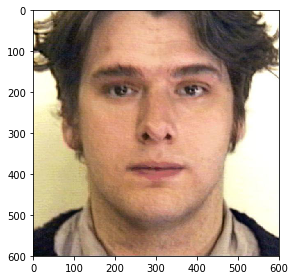

In [4]:
skimage.io.imshow(image_X[7].reshape(600,600,3))

請畫出所有臉的平均

In [5]:
mean_face = np.mean(image_X,axis=0)
print(mean_face.shape)

(1080000,)


In [6]:
mean_face

array([ 230.58072289,  229.6939759 ,  224.04578313, ...,    0.59759036,
          0.29879518,    1.01204819])

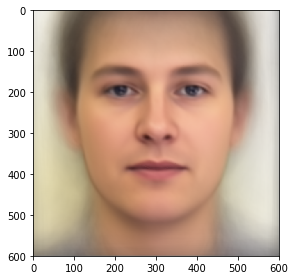

In [7]:
skimage.io.imshow(mean_face.astype(np.uint8).reshape(600,600,3))

請畫出前四個 Eigenfaces，也就是對應到前四大 Eigenvalues 的 Eigenvectors。

In [8]:
mean_face

array([ 230.58072289,  229.6939759 ,  224.04578313, ...,    0.59759036,
          0.29879518,    1.01204819])

image center shape (415, 1080000)
U shape (1080000, 415)
S shape (415,)
V shape (415, 415)


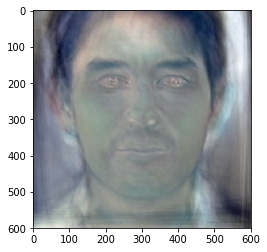

In [9]:
image_center = image_X - mean_face

print("image center shape",image_center.shape)

U, S, V = np.linalg.svd(image_center.T, full_matrices=False)

print("U shape",U.shape)
print("S shape",S.shape)
print("V shape",V.shape)
fig = plt.figure()
# plot eigen face
M = -U[:,9].reshape(600,600,3)
M -= np.min(M)
M /= np.max(M)
M = (M * 255).astype(np.uint8)
plt.imshow(M)
plt.show()

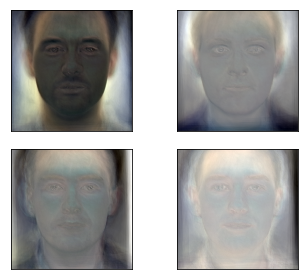

In [10]:
fig = plt.figure()
for i in range(4):
    M = U[:,i].reshape(600,600,3)
    M -= np.min(M)
    M /= np.max(M)
    M = (M * 255).astype(np.uint8)
    ax = fig.add_subplot(2, 2, i+1)
    ax.imshow(M)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

請從數據集中挑出任意四個圖片，並用前四大 Eigenfaces 進行 reconstruction，並畫出結果。

In [11]:
# reconstruct 
image_center = image_X - mean_face
print("image center shape",image_center.shape)
U, S, V = np.linalg.svd(image_center.T, full_matrices=False)
weights = np.dot(image_center, U)

image center shape (415, 1080000)


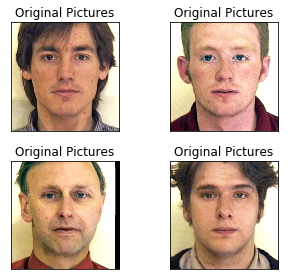

In [41]:
image_for_gif = []
fig = plt.figure()
for i,j in zip([0,45,92,7],list(range(4))):
    ax = fig.add_subplot(2, 2, j+1)
    ax.imshow(image_X[i].reshape(600,600,3))
    plt.title("Original Pictures")
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.savefig("gif/1.jpg")

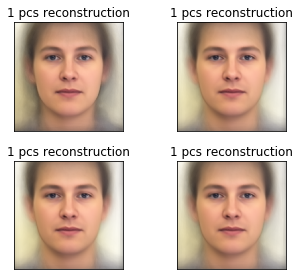

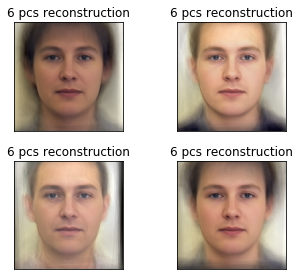

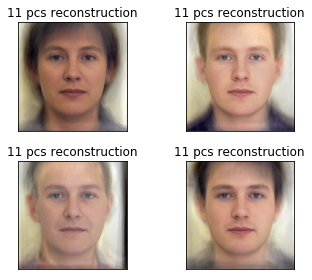

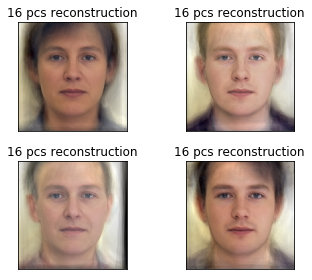

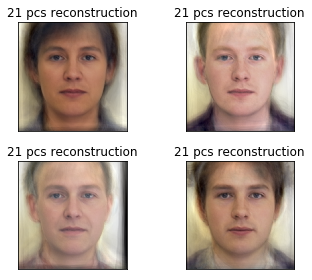

...

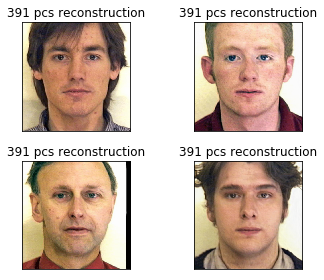

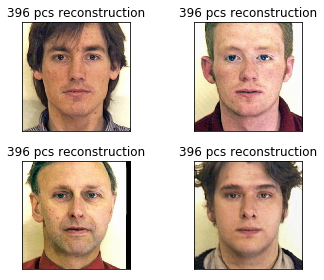

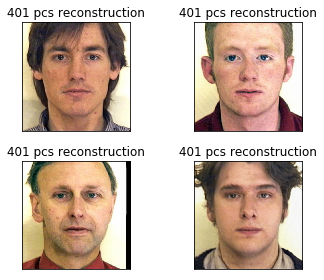

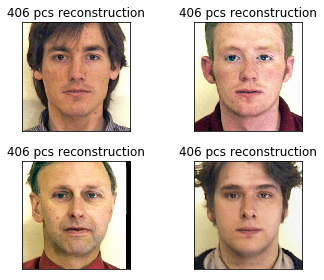

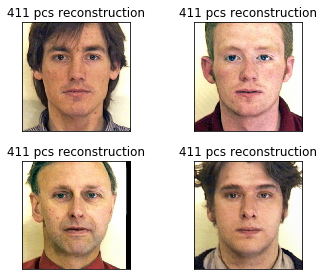

In [42]:
# top = 1
for top in range(1,415,5):
    fig = plt.figure()
    for i,j in zip([0,45,92,7],list(range(4))):
        recon = mean_face + np.dot(weights[i, :top], U[:, :top].T)
        ax = fig.add_subplot(2, 2, j+1)
        recon -= np.min(recon)
        recon /= np.max(recon)
        recon = (recon * 255).astype(np.uint8)

        ax.imshow(recon.reshape(600,600,3))
        plt.title(str(top)+" pcs reconstruction")
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    
    top+=1
    plt.savefig("gif/"+str(top)+".jpg")
    plt.show()

In [44]:
from os import listdir
import imageio
image_for_gif.append(imageio.imread("gif/1.jpg"))
for top in range(1,415,5):
    top+=1
    image_for_gif.append(imageio.imread("gif/" +str(top)+ ".jpg"))


In [45]:
imageio.mimsave('gif/reconstruction.gif', image_for_gif)

請寫出前四大 Eigenfaces 各自所佔的比重 (explained variance ratio)，請四捨五入到小數點後一位。

In [49]:
# reconstruct 
image_center = image_X - mean_face
print("image center shape",image_center.shape)
U, S, V = np.linalg.svd(image_center.T, full_matrices=False)
print(S[:4])

image center shape (415, 1080000)
[ 540369.68658409  384451.08314605  311306.05386833  287854.91973038]


In [69]:
print((S[:4]/np.sum(S[:4])))
print((S/np.sum(S))[:4])

[ 0.35457753  0.25226751  0.20427151  0.18888344]
[ 0.04144625  0.02948732  0.02387711  0.02207842]


# Part B: Visualization of Chinese word embedding

In [51]:
import gensim
import jieba
import matplotlib.pyplot as plt
%matplotlib inline
jieba.set_dictionary("/home/thtang/.local/lib/python3.5/site-packages/jieba/dict.txt.big.txt")
with open("all_sents.txt","r") as f:
    all_sents = [jieba.lcut(i.strip()) for i in f.readlines()]

Building prefix dict from /home/thtang/.local/lib/python3.5/site-packages/jieba/dict.txt.big.txt ...
Loading model from cache /tmp/jieba.u9954882b0b04d217f4ebf888df24ffdf.cache
Loading model cost 1.311 seconds.
Prefix dict has been built succesfully.


In [52]:
# 使用 gensim 調整 embedding size 和 min count
w2v_model = gensim.models.word2vec.Word2Vec(all_sents,size=100, window=4, min_count=3000, workers=4)

In [53]:
words = list(w2v_model.wv.vocab.keys())
vectors = []
for word in words:
    vectors.append(w2v_model.wv[word])

In [54]:
from sklearn.manifold import TSNE

# tsne dimension reduction
tsne = TSNE(n_components=2, random_state=0, perplexity=30)
vis_data = tsne.fit_transform(vectors)

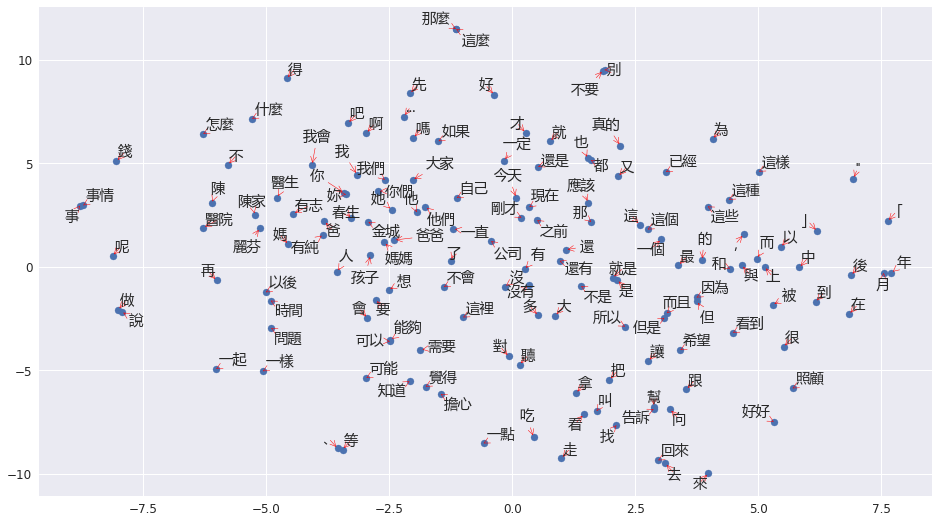

In [55]:
# 請在 Report 上放上你 visualization 的結果。
#coding:utf-8
import matplotlib.font_manager as fm
from adjustText import adjust_text
import seaborn as sns
sns.set(style='darkgrid', rc={'figure.facecolor':'white'}, font_scale=1.2)
myfont = fm.FontProperties(fname='/home/thtang/.local/lib/python3.5/site-packages/matplotlib/mpl-data/fonts/ttf/msyh.ttf')
x = vis_data[:,0]
y = vis_data[:,1]
text = words

plt.figure(figsize=(16,9))
plt.scatter(x, y)
texts = []
for a, b, s in zip(x, y, text):
    texts.append(plt.text(a, b, s,fontproperties=myfont))
adjust_text(texts, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))

plt.show()

# Part C: Image clustering

請比較至少兩種不同的 feature extraction 及其結果。

In [59]:
# autoencoder 
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense
from keras.models import Model
%matplotlib inline
%env CUDA_VISIBLE_DEVICES= 3
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.4
set_session(tf.Session(config=config))


Using TensorFlow backend.


env: CUDA_VISIBLE_DEVICES=3


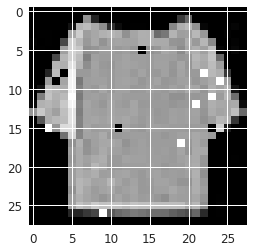

In [60]:
image = np.load("image.npy/image.npy")
# normalize image
image = image / 255

plt.imshow(image[0].reshape(28,28),"gray")
plt.show()

In [61]:
# this is the size of our encoded representations
encoding_dim = 32  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# this is our input placeholder
input_img = Input(shape=(784,))
# "encoded" is the encoded representation of the input
encoded = Dense(encoding_dim, activation='relu')(input_img)
# "decoded" is the lossy reconstruction of the input
decoded = Dense(784, activation='sigmoid')(encoded)

# this model maps an input to its reconstruction
autoencoder = Model(input_img, decoded)
encoder = Model(input_img, encoded)

# create a placeholder for an encoded (32-dimensional) input
encoded_input = Input(shape=(encoding_dim,))
# retrieve the last layer of the autoencoder model
decoder_layer = autoencoder.layers[-1]
# create the decoder model
decoder = Model(encoded_input, decoder_layer(encoded_input))

In [62]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

In [63]:
autoencoder.fit(image, image,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_split = 0.1)

Train on 126000 samples, validate on 14000 samples
Epoch 1/50
126000/126000 [==============================] - 3s - loss: 0.3186 - val_loss: 0.2500
Epoch 2/50
126000/126000 [==============================] - 3s - loss: 0.2329 - val_loss: 0.2225
Epoch 3/50
126000/126000 [==============================] - 3s - loss: 0.2178 - val_loss: 0.2156
Epoch 4/50
126000/126000 [==============================] - 2s - loss: 0.2136 - val_loss: 0.2135
Epoch 5/50
126000/126000 [==============================] - 3s - loss: 0.2118 - val_loss: 0.2118
Epoch 6/50
126000/126000 [==============================] - 2s - loss: 0.2107 - val_loss: 0.2109
Epoch 7/50
126000/126000 [==============================] - 2s - loss: 0.2100 - val_loss: 0.2102
Epoch 8/50
126000/126000 [==============================] - 2s - loss: 0.2094 - val_loss: 0.2096
Epoch 9/50
126000/126000 [==============================] - 2s - loss: 0.2090 - val_loss: 0.2094
Epoch 10/50
126000/126000 [==============================] - 2s - loss: 0.20

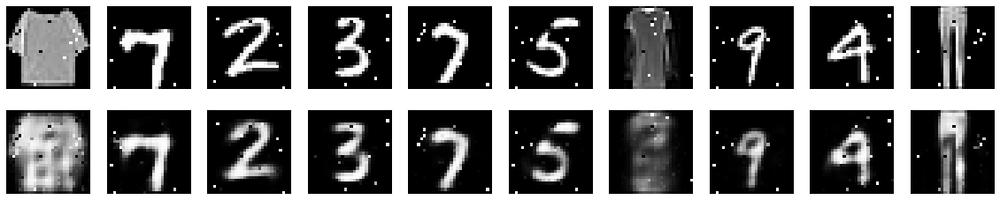

In [64]:
# reconstruct 
encoded_imgs = encoder.predict(image[:10])
image_X_autoencoder = encoder.predict(image)
decoded_imgs = decoder.predict(encoded_imgs)
# plot
n = 10  # how many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(image[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [65]:
from sklearn.decomposition import PCA
pca = PCA(n_components=32, whiten=True,svd_solver="full")
image_X_PCA = pca.fit_transform(image)

In [66]:
decoded_imgs = pca.inverse_transform(image_X_PCA[:10])

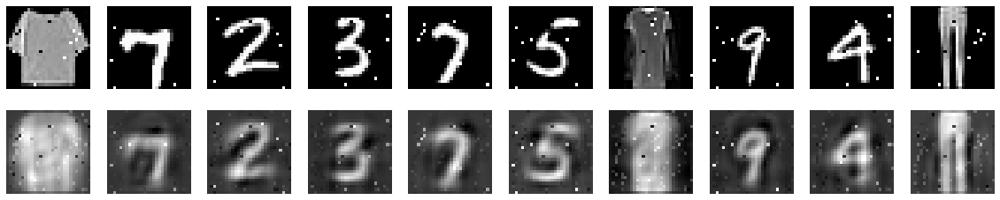

In [67]:
n = 10  # how many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(image[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [68]:
from sklearn.cluster import KMeans
import pandas as pd
# load testing data
test_case = pd.read_csv("test_case.csv")
test_case.head()

# clustering 
cluster_AUTOENCODER = KMeans(n_clusters=2)
cluster_AUTOENCODER.fit(image_X_autoencoder)

cluster_PCA= KMeans(n_clusters=2)
cluster_PCA.fit(image_X_PCA)

def clust_ans(cluster):
    ans = []
    for a, b in zip(test_case["image1_index"],test_case["image2_index"]):
        if cluster.labels_[a] == cluster.labels_[b]:
            ans.append(1)
        else:
            ans.append(0)
    return ans
# submission
sample_submission = pd.read_csv("sample_submission.csv")
sample_submission["Ans"] = clust_ans(cluster_AUTOENCODER)
sample_submission.to_csv("ML_hw6_submission_autoencoder.csv",index=None)

sample_submission = pd.read_csv("sample_submission.csv")
sample_submission["Ans"] = clust_ans(cluster_PCA)
sample_submission.to_csv("ML_hw6_submission_pca.csv",index=None)

In [9]:
os.path.join("../Aberdeen/",str(1)+".jpg")

'../Aberdeen/1.jpg'